# Manual lookup

In [1]:
import itertools
import math
import numpy as np
import os
import pathlib
import shutil

import awkward as ak
import hist
import matplotlib
import matplotlib.pyplot as plt
import mplhep as hep
import vector
import uproot

from coffea import nanoevents
from hist import Hist
from rich import print
from rich.progress import track

In [11]:
matplotlib.rcParams.update({"figure.max_open_warning": 0})
plt.style.use(hep.style.CMS)

In [3]:
vector.register_awkward()

In [4]:
ak.numba.register()

In [5]:
np.set_printoptions(suppress=True)

In [70]:
# Parameters
mS = 125
T = 8
mD = 8
decay = ("darkPho", "leptonic")

# Some common paths
xrd_path = "root://cmseos.fnal.gov//store/user/chpapage"
campaign = "pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1"
signal_private = (
    f"{xrd_path}/SUEP_low_temp/2018/NANOAOD_merged/"
    f"step_NANOAOD_ggH-channel_mMed-{mS}_mDark-{mD}_temp-{T}_decay-{decay[0]}_13TeV-pythia8.root"
)
signal_central = (
    f"{xrd_path}/Central_NANO_split_merged/GluGluToSUEP_T{T}p00_TuneCP5_13TeV_"
    f"{campaign}-v2+NANOAODSIM/GluGluToSUEP_mS{mS}.000_mPhi{mD}.000_T{T}.000_mode{decay[1]}_1.root"
)

In [71]:
file_c = nanoevents.NanoEventsFactory.from_root(
    signal_central, schemaclass=nanoevents.NanoAODSchema
)
file_p = nanoevents.NanoEventsFactory.from_root(
    signal_private, schemaclass=nanoevents.NanoAODSchema
)
events_c = file_c.events()
events_p = file_p.events()

In [72]:
events_c.Muon.pt

<Array [[453, 4.2, 3.86, ... 4.51, 3.82, 3.56]] type='60000 * var * float32[para...'>

In [10]:
1 / len(events_p)

0.0001

In [11]:
gen_med_c = ak.firsts(
    events_c.GenPart[(events_c.GenPart.pdgId == 25) & (events_c.GenPart.status == 62)]
)
gen_med_p = ak.firsts(
    events_p.GenPart[(events_p.GenPart.pdgId == 25) & (events_p.GenPart.status == 62)]
)

In [73]:
gen_muons_mask_c = (
    # (events_c.GenPart.pt > 3)
    # & (abs(events_c.GenPart.eta) < 2.4)
    (events_c.GenPart.status == 1)
    & (abs(events_c.GenPart.pdgId) == 13)
)
gen_muons_c = events_c.GenPart[gen_muons_mask_c]

gen_muons_mask_p = (
    # (events_p.GenPart.pt > 3)
    # & (abs(events_p.GenPart.eta) < 2.4)
    (events_p.GenPart.status == 1)
    & (abs(events_p.GenPart.pdgId) == 13)
)
gen_muons_p = events_p.GenPart[gen_muons_mask_p]

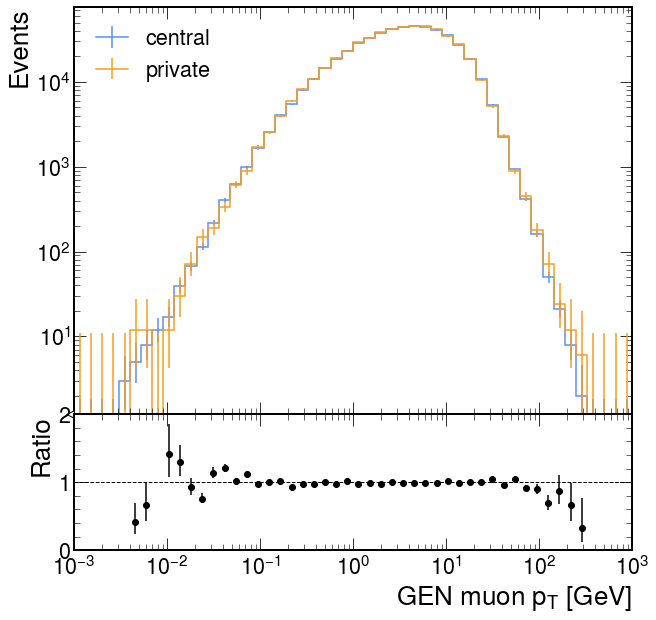

In [78]:
h_c = (
    Hist.new.Reg(
        50,
        1e-3,
        1e3,
        name=r"GEN muon $p_T$ [GeV]",
        label=r"GEN muon $p_T$ [GeV]",
        transform=hist.axis.transform.log,
    )
    .Weight()
    .fill(ak.flatten(gen_muons_c.pt), weight=1)
)
h_p = (
    Hist.new.Reg(
        50,
        1e-3,
        1e3,
        name=r"GEN muon $p_T$ [GeV]",
        label=r"GEN muon $p_T$ [GeV]",
        transform=hist.axis.transform.log,
    )
    .Weight()
    .fill(ak.flatten(gen_muons_p.pt), weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.xscale("log")
plt.show()

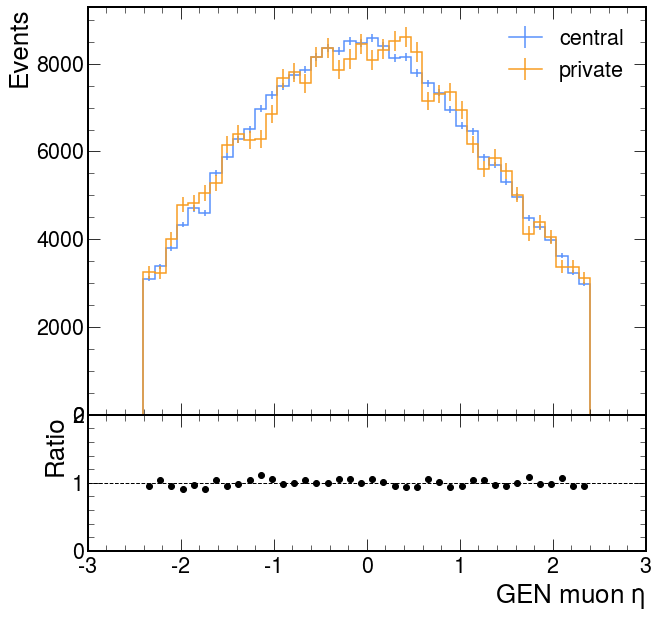

In [43]:
h_c = (
    Hist.new.Reg(50, -3, 3, name=r"GEN muon $\eta$", label=r"GEN muon $\eta$")
    .Weight()
    .fill(ak.flatten(gen_muons_c.eta), weight=1)
)
h_p = (
    Hist.new.Reg(50, -3, 3, name=r"GEN muon $\eta$", label=r"GEN muon $\eta$")
    .Weight()
    .fill(ak.flatten(gen_muons_p.eta), weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.show()

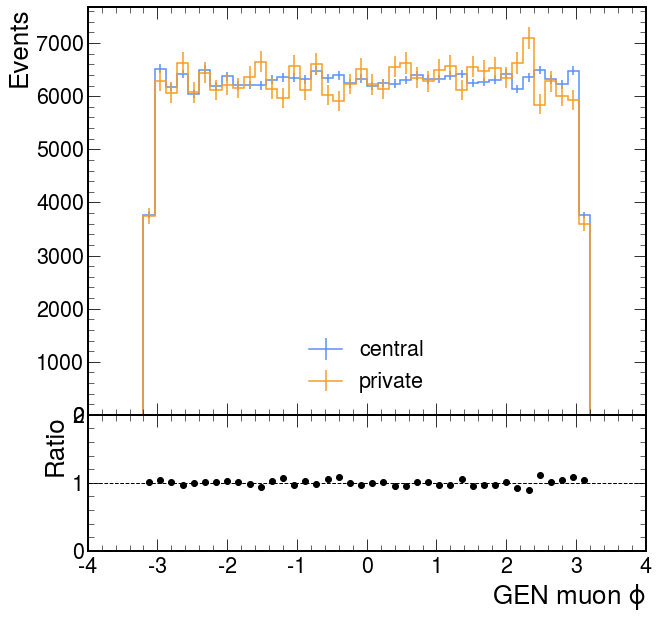

In [45]:
h_c = (
    Hist.new.Reg(50, -4, 4, name=r"GEN muon $\phi$", label=r"GEN muon $\phi$")
    .Weight()
    .fill(ak.flatten(gen_muons_c.phi), weight=1)
)
h_p = (
    Hist.new.Reg(50, -4, 4, name=r"GEN muon $\phi$", label=r"GEN muon $\phi$")
    .Weight()
    .fill(ak.flatten(gen_muons_p.phi), weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.show()

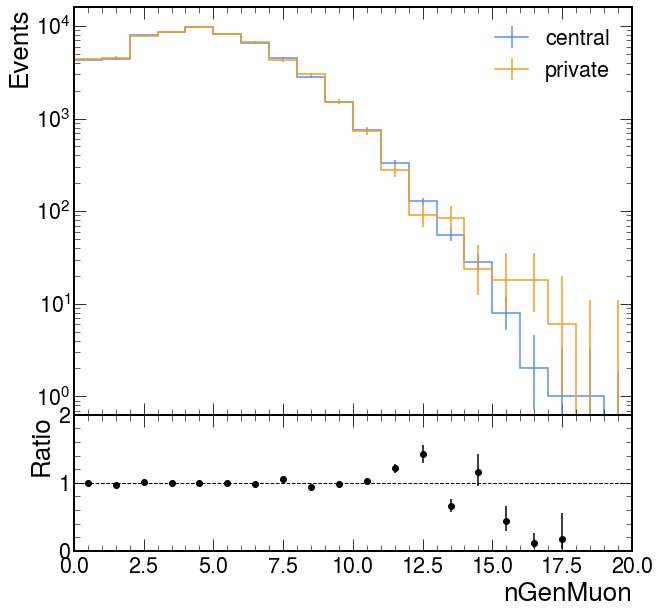

In [32]:
h_c = (
    Hist.new.Reg(20, 0, 20, name="nGenMuon", label="nGenMuon")
    .Weight()
    .fill(ak.num(gen_muons_c), weight=1)
)
h_p = (
    Hist.new.Reg(20, 0, 20, name="nGenMuon", label="nGenMuon")
    .Weight()
    .fill(ak.num(gen_muons_p), weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.show()

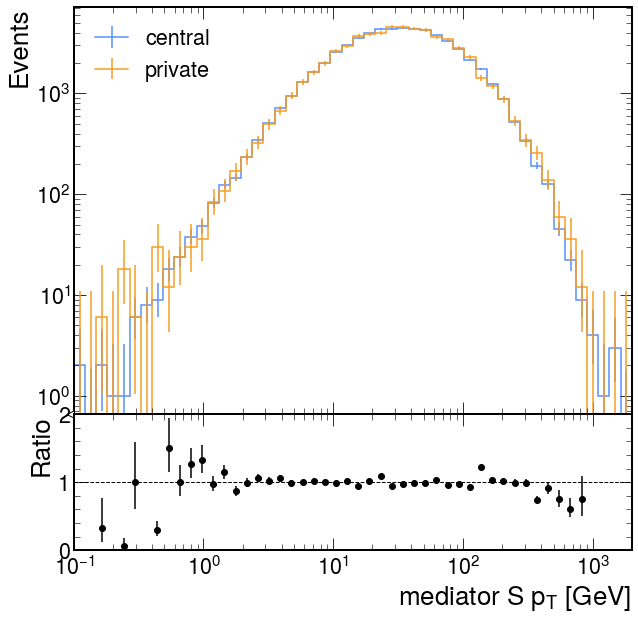

In [36]:
h_c = (
    Hist.new.Reg(
        50,
        0.1,
        2000,
        name=r"mediator S $p_T$ [GeV]",
        label=r"mediator S $p_T$ [GeV]",
        transform=hist.axis.transform.log,
    )
    .Weight()
    .fill(gen_med_c.pt, weight=1)
)
h_p = (
    Hist.new.Reg(
        50,
        0.1,
        2000,
        name=r"mediator S $p_T$ [GeV]",
        label=r"mediator S $p_T$ [GeV]",
        transform=hist.axis.transform.log,
    )
    .Weight()
    .fill(gen_med_p.pt, weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.xscale("log")
plt.show()

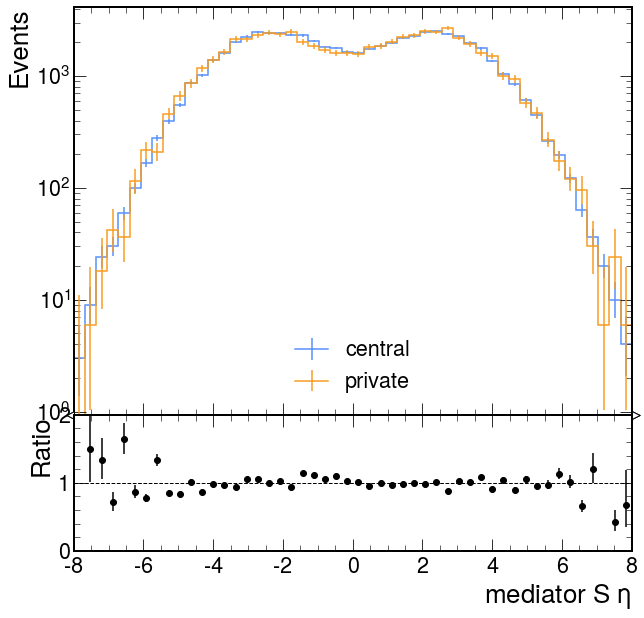

In [37]:
h_c = (
    Hist.new.Reg(50, -8, 8, name=r"mediator S $\eta$", label=r"mediator S $\eta$")
    .Weight()
    .fill(gen_med_c.eta, weight=1)
)
h_p = (
    Hist.new.Reg(50, -8, 8, name=r"mediator S $\eta$", label=r"mediator S $\eta$")
    .Weight()
    .fill(gen_med_p.eta, weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.show()

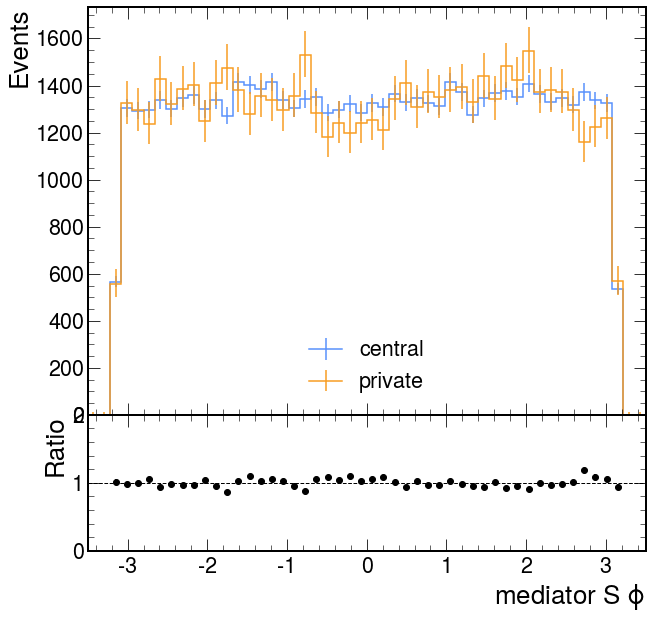

In [38]:
h_c = (
    Hist.new.Reg(50, -3.5, 3.5, name=r"mediator S $\phi$", label=r"mediator S $\phi$")
    .Weight()
    .fill(gen_med_c.phi, weight=1)
)
h_p = (
    Hist.new.Reg(50, -3.5, 3.5, name=r"mediator S $\phi$", label=r"mediator S $\phi$")
    .Weight()
    .fill(gen_med_p.phi, weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.show()

In [52]:
clean_muons_c = (
    events_c.Muon.mediumId
    & (events_c.Muon.pt > 3)
    & (abs(events_c.Muon.eta) < 2.4)
    & (abs(events_c.Muon.dz) <= 0.2)
)
muons_c = events_c.Muon[clean_muons_c]

clean_muons_p = (
    events_p.Muon.mediumId
    & (events_p.Muon.pt > 3)
    & (abs(events_p.Muon.eta) < 2.4)
    & (abs(events_p.Muon.dz) <= 0.2)
)
muons_p = events_p.Muon[clean_muons_p]

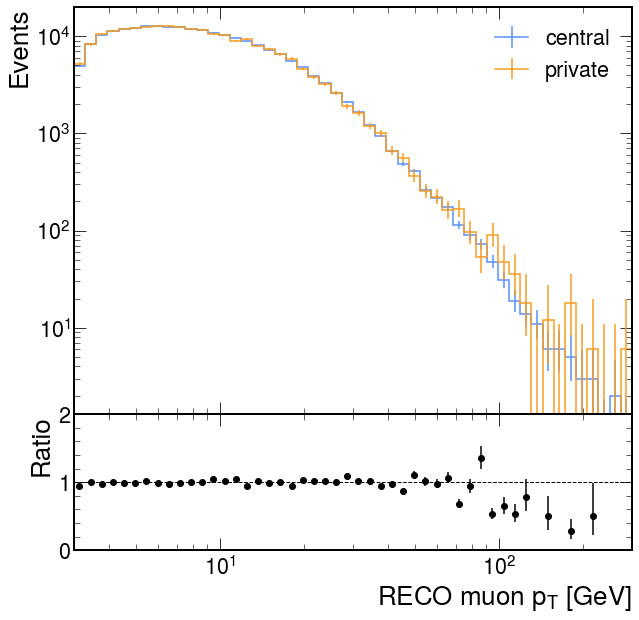

In [53]:
h_c = (
    Hist.new.Reg(
        50,
        3,
        300,
        name=r"RECO muon $p_T$ [GeV]",
        label=r"RECO muon $p_T$ [GeV]",
        transform=hist.axis.transform.log,
    )
    .Weight()
    .fill(ak.flatten(muons_c.pt), weight=1)
)
h_p = (
    Hist.new.Reg(
        50,
        3,
        300,
        name=r"RECO muon $p_T$ [GeV]",
        label=r"RECO muon $p_T$ [GeV]",
        transform=hist.axis.transform.log,
    )
    .Weight()
    .fill(ak.flatten(muons_p.pt), weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.xscale("log")
plt.show()

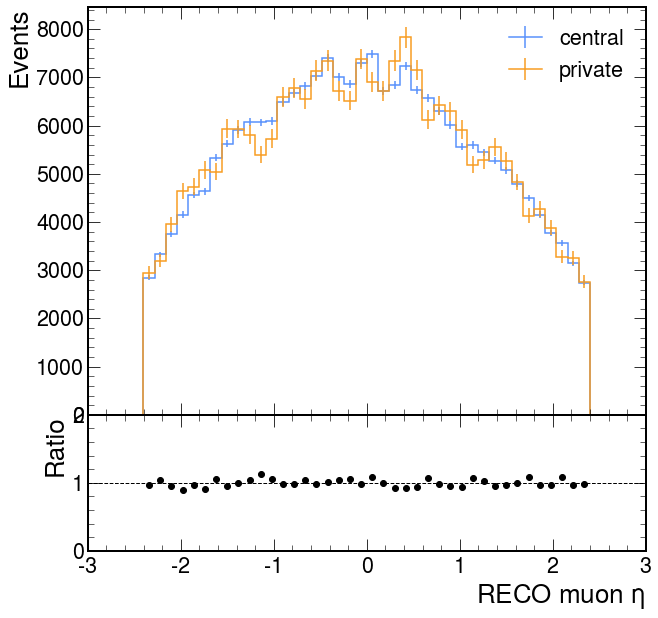

In [54]:
h_c = (
    Hist.new.Reg(50, -3, 3, name=r"RECO muon $\eta$", label=r"RECO muon $\eta$")
    .Weight()
    .fill(ak.flatten(muons_c.eta), weight=1)
)
h_p = (
    Hist.new.Reg(50, -3, 3, name=r"RECO muon $\eta$", label=r"RECO muon $\eta$")
    .Weight()
    .fill(ak.flatten(muons_p.eta), weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.show()

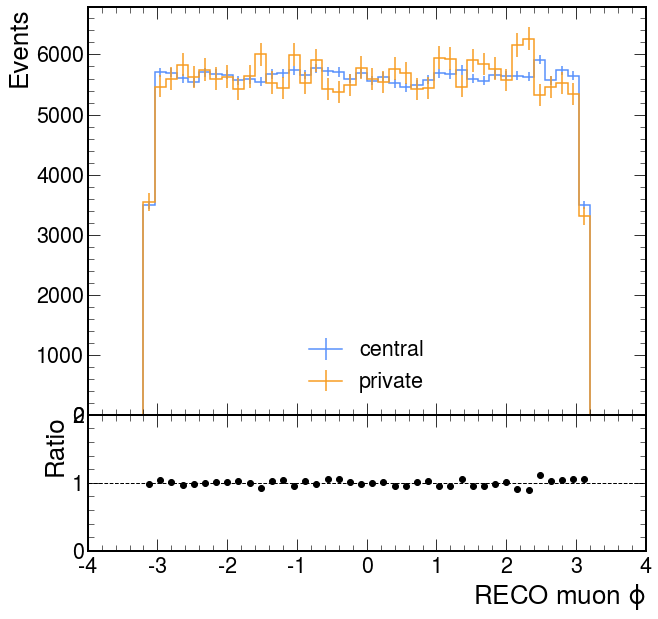

In [55]:
h_c = (
    Hist.new.Reg(50, -4, 4, name=r"RECO muon $\phi$", label=r"RECO muon $\phi$")
    .Weight()
    .fill(ak.flatten(muons_c.phi), weight=1)
)
h_p = (
    Hist.new.Reg(50, -4, 4, name=r"RECO muon $\phi$", label=r"RECO muon $\phi$")
    .Weight()
    .fill(ak.flatten(muons_p.phi), weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_ylabel("Events")
subplot_ax.set_ylim(0.0, 2.0)
plt.show()

In [68]:
jet_cut_c = (events_c.Jet.pt > 20) & (abs(events_c.Jet.eta) < 2.4)
jets_c = events_c.Jet[jet_cut_c]
ht_c = ak.sum(jets_c.pt, axis=-1)

jet_cut_p = (events_p.Jet.pt > 20) & (abs(events_p.Jet.eta) < 2.4)
jets_p = events_p.Jet[jet_cut_p]
ht_p = ak.sum(jets_p.pt, axis=-1)

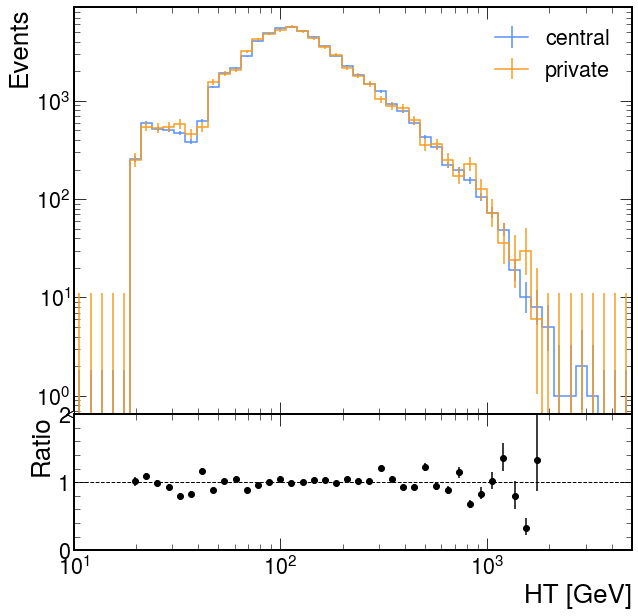

In [73]:
h_c = (
    Hist.new.Reg(
        50,
        10,
        5000,
        name=r"HT [GeV]",
        label=r"HT [GeV]",
        transform=hist.axis.transform.log,
    )
    .Weight()
    .fill(ht_c, weight=1)
)
h_p = (
    Hist.new.Reg(
        50,
        10,
        5000,
        name=r"HT [GeV]",
        label=r"HT [GeV]",
        transform=hist.axis.transform.log,
    )
    .Weight()
    .fill(ht_p, weight=len(events_c) / len(events_p))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
    h_p,
    rp_ylabel=r"Ratio",
    rp_num_label="central",
    rp_denom_label="private",
    ax_dict=ax_dict,
)
main_ax.set_ylabel("Events")
main_ax.set_yscale("log")
subplot_ax.set_ylim(0.0, 2.0)
plt.xscale("log")
plt.show()

## Mass produce validation plots

In [113]:
models = [
    (125, 1, 0.25, "leptonic"),
    (125, 1.4, 0.35, "hadronic"),
    (125, 4, 1, "hadronic"),
    (125, 4, 1, "leptonic"),
    (125, 1.4, 1.4, "hadronic"),
    (125, 2, 2, "hadronic"),
    (125, 2, 2, "leptonic"),
    (125, 8, 2, "hadronic"),
    (125, 8, 2, "leptonic"),
    (125, 1.4, 2.8, "hadronic"),
    (125, 2, 4, "hadronic"),
    (125, 2, 4, "leptonic"),
    (125, 4, 4, "hadronic"),
    (125, 4, 4, "leptonic"),
    (125, 8, 4, "hadronic"),
    (125, 8, 4, "leptonic"),
    (125, 1.4, 5.6, "hadronic"),
    (125, 2, 8, "hadronic"),
    (125, 2, 8, "leptonic"),
    (125, 4, 8, "hadronic"),
    (125, 4, 8, "leptonic"),
    (125, 8, 8, "hadronic"),
    (125, 8, 8, "leptonic"),
    (125, 4, 16, "hadronic"),
    (125, 4, 16, "leptonic"),
    (125, 8, 16, "hadronic"),
    (125, 8, 16, "leptonic"),
    (125, 8, 32, "hadronic"),
    (125, 8, 32, "leptonic"),
]

In [115]:
new2old = {
    # Convert old decay names to new
    "leptonic": "darkPho",
    "hadronic": "darkPhoHad",
}


def load_events(mS, mD, T, decay):
    # Some common paths
    xrd_path = "root://cmseos.fnal.gov//store/user/chpapage"
    campaign = "pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1"
    signal_private = (
        f"{xrd_path}/SUEP_low_temp/2018/NANOAOD_merged/step_NANOAOD_ggH-channel_"
        + f"mMed-{mS}_mDark-{mD}_temp-{T}_decay-{new2old[decay]}_13TeV-pythia8.root"
    )
    signal_central = (
        f"{xrd_path}/Central_NANO_split_merged/GluGluToSUEP_"
        + f"T{T:.2f}_TuneCP5_13TeV_{campaign}-v2+NANOAODSIM/".replace(".", "p")
        + f"GluGluToSUEP_mS{mS:.3f}_mPhi{mD:.3f}_T{T:.3f}_mode{decay}_1.root"
    )
    file_c = nanoevents.NanoEventsFactory.from_root(
        signal_central, schemaclass=nanoevents.NanoAODSchema
    )
    file_p = nanoevents.NanoEventsFactory.from_root(
        signal_private, schemaclass=nanoevents.NanoAODSchema
    )
    return file_c.events(), file_p.events()


def get_gen_muons(events_c, events_p):
    gen_muons_mask_c = (
        (events_c.GenPart.pt > 3)
        & (abs(events_c.GenPart.eta) < 2.4)
        & (events_c.GenPart.status == 1)
        & (abs(events_c.GenPart.pdgId) == 13)
    )
    gen_muons_mask_p = (
        (events_p.GenPart.pt > 3)
        & (abs(events_p.GenPart.eta) < 2.4)
        & (events_p.GenPart.status == 1)
        & (abs(events_p.GenPart.pdgId) == 13)
    )
    gen_muons_c = events_c.GenPart[gen_muons_mask_c]
    gen_muons_p = events_p.GenPart[gen_muons_mask_p]
    return gen_muons_c, gen_muons_p


def get_reco_muons(events_c, events_p):
    clean_muons_c = (
        events_c.Muon.mediumId
        & (events_c.Muon.pt > 3)
        & (abs(events_c.Muon.eta) < 2.4)
        & (abs(events_c.Muon.dz) <= 0.2)
    )
    clean_muons_p = (
        events_p.Muon.mediumId
        & (events_p.Muon.pt > 3)
        & (abs(events_p.Muon.eta) < 2.4)
        & (abs(events_p.Muon.dz) <= 0.2)
    )
    muons_c = events_c.Muon[clean_muons_c]
    muons_p = events_p.Muon[clean_muons_p]
    return muons_c, muons_p


def get_scalar_med(events_c, events_p):
    gen_med_c = ak.firsts(
        events_c.GenPart[
            (events_c.GenPart.pdgId == 25) & (events_c.GenPart.status == 62)
        ]
    )
    gen_med_p = ak.firsts(
        events_p.GenPart[
            (events_p.GenPart.pdgId == 25) & (events_p.GenPart.status == 62)
        ]
    )
    return gen_med_c, gen_med_p


def get_ht(events_c, events_p):
    jet_cut_c = (events_c.Jet.pt > 20) & (abs(events_c.Jet.eta) < 2.4)
    jets_c = events_c.Jet[jet_cut_c]
    jet_cut_p = (events_p.Jet.pt > 20) & (abs(events_p.Jet.eta) < 2.4)
    jets_p = events_p.Jet[jet_cut_p]
    return ak.sum(jets_c.pt, axis=-1), ak.sum(jets_p.pt, axis=-1)


def plot_template(
    mS,
    mD,
    T,
    decay,
    quantity,
    vals_c,
    vals_p,
    binning,
    log_x=False,
    log_y=True,
    label=None,
):
    if label is None:
        label = quantity
    extra_args = {}
    if log_x:
        extra_args["transform"] = hist.axis.transform.log

    h_c = (
        Hist.new.Reg(*binning, name=quantity, label=label, **extra_args)
        .Weight()
        .fill(vals_c, weight=1)
    )
    h_p = (
        Hist.new.Reg(*binning, name=quantity, label=label, **extra_args)
        .Weight()
        .fill(vals_p, weight=len(vals_c) / len(vals_p))
    )

    fig = plt.figure()
    grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

    main_ax = fig.add_subplot(grid[0])
    subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
    plt.setp(main_ax.get_xticklabels(), visible=False)
    ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

    main_ax_artists, sublot_ax_arists = h_c.plot_ratio(
        h_p,
        rp_ylabel=r"Ratio",
        rp_num_label="central",
        rp_denom_label="private",
        ax_dict=ax_dict,
    )
    main_ax.set_title(f"$m_S$={mS} GeV, $m_D$={mD} GeV\nT={T} GeV, {decay}")
    if log_x:
        plt.xscale("log")
    if log_y:
        main_ax.set_yscale("log")
    main_ax.set_ylabel("Events")
    subplot_ax.set_ylim(0.0, 2.0)
    pathlib.Path(f"validation_plots/{quantity}").mkdir(parents=True, exist_ok=True)
    plt.savefig(
        f"validation_plots/{quantity}/{quantity}_mMed-{mS}_mDark-{mD}_temp-{T}_decay-{decay}.pdf"
    )
    plt.close()

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00

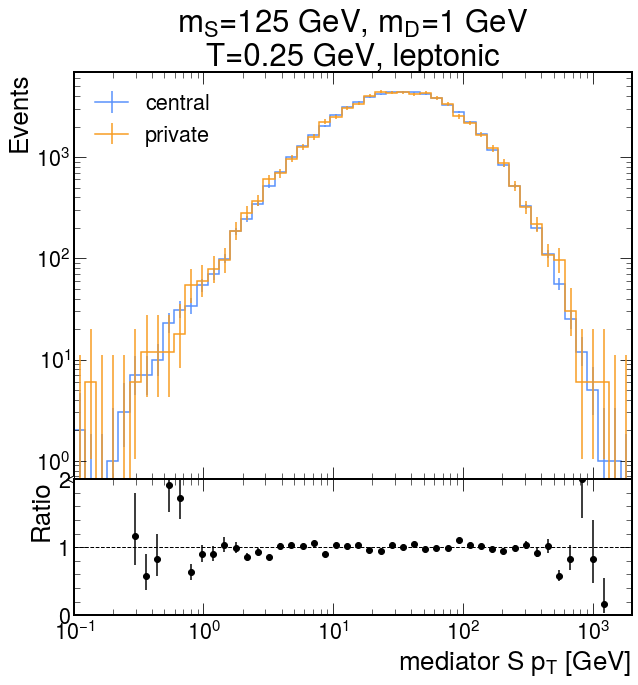

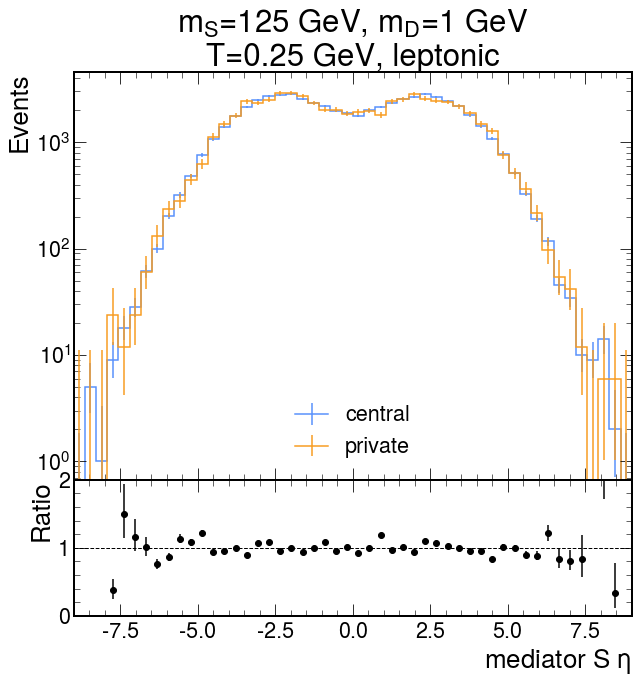

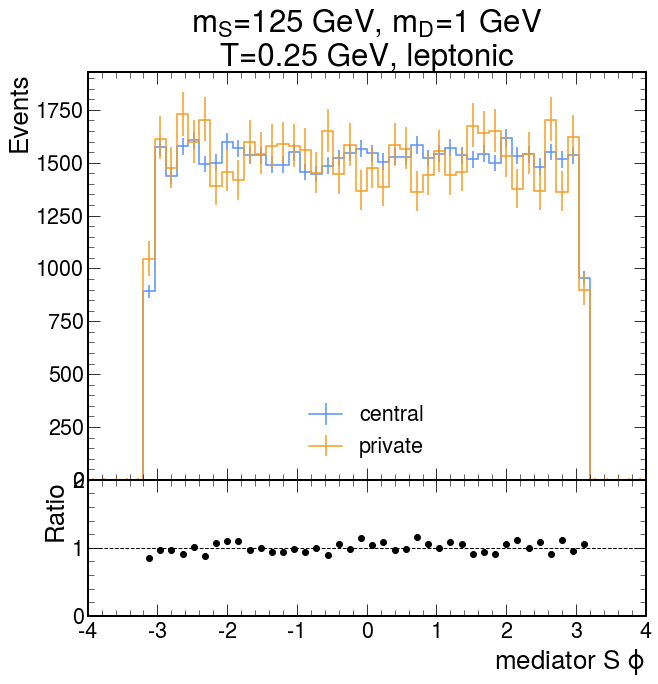

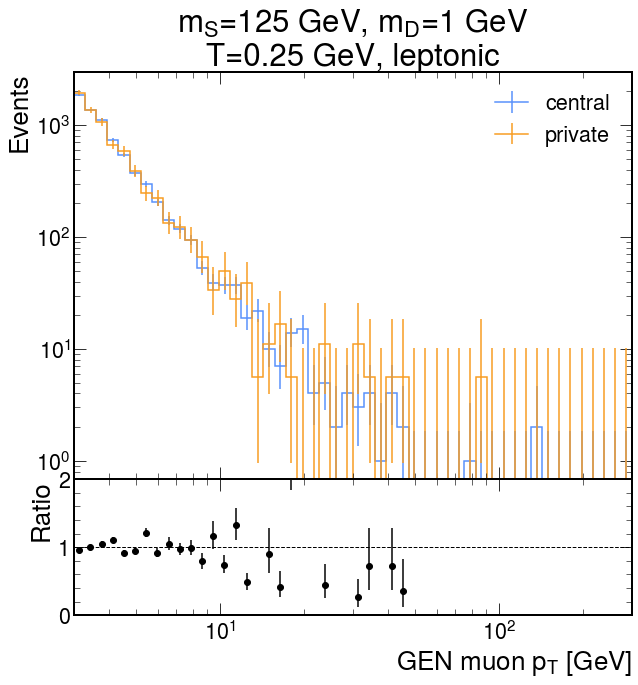

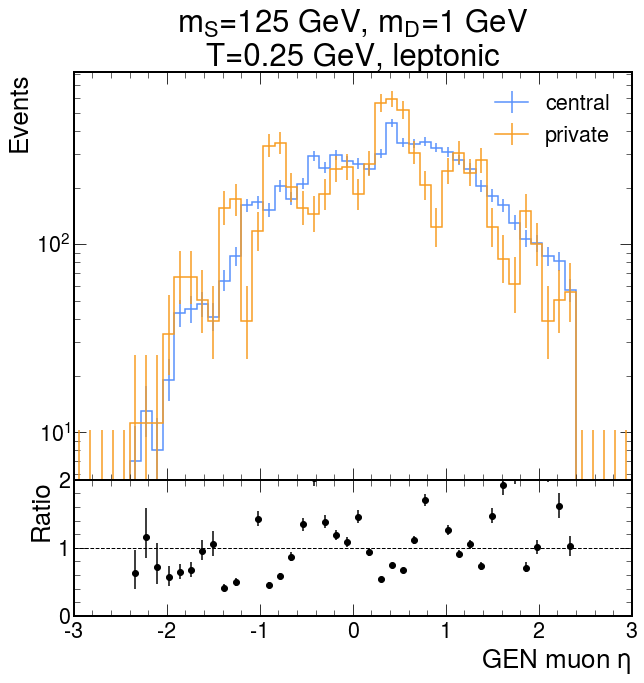

...

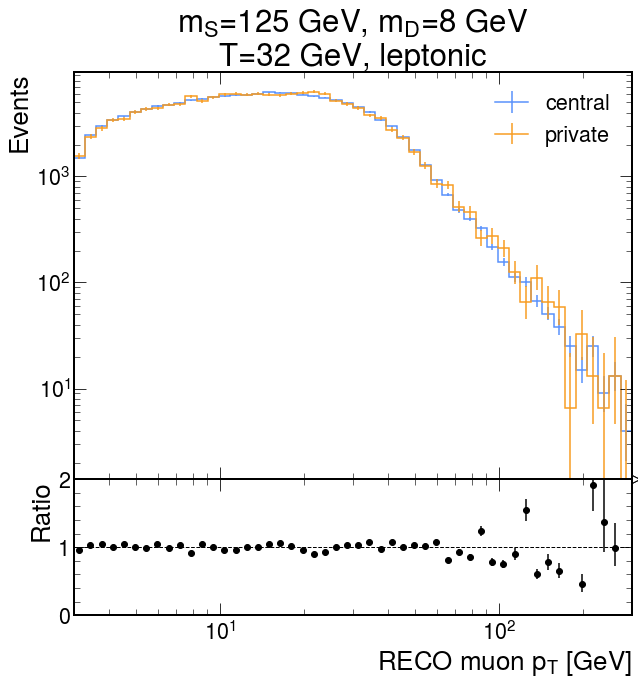

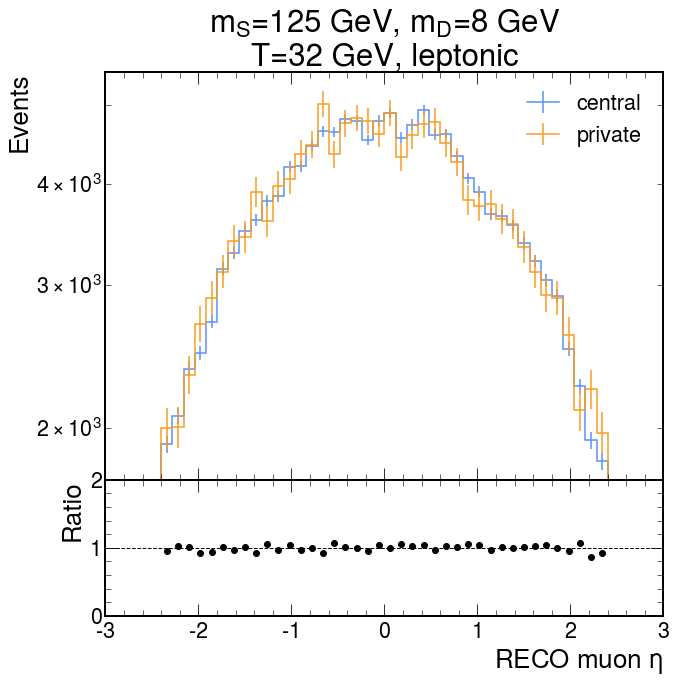

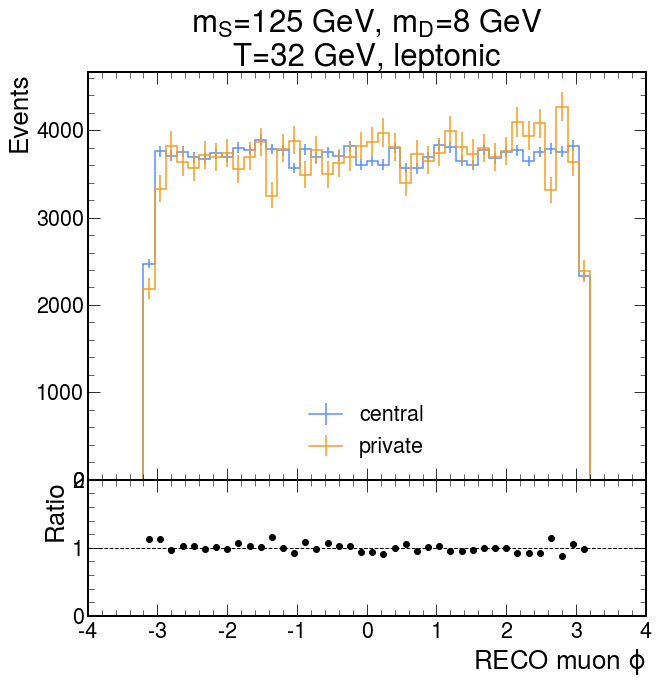

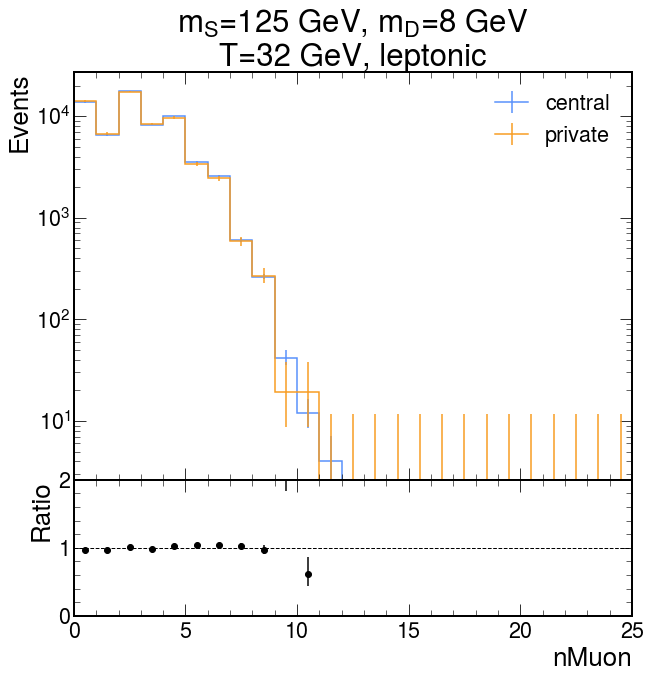

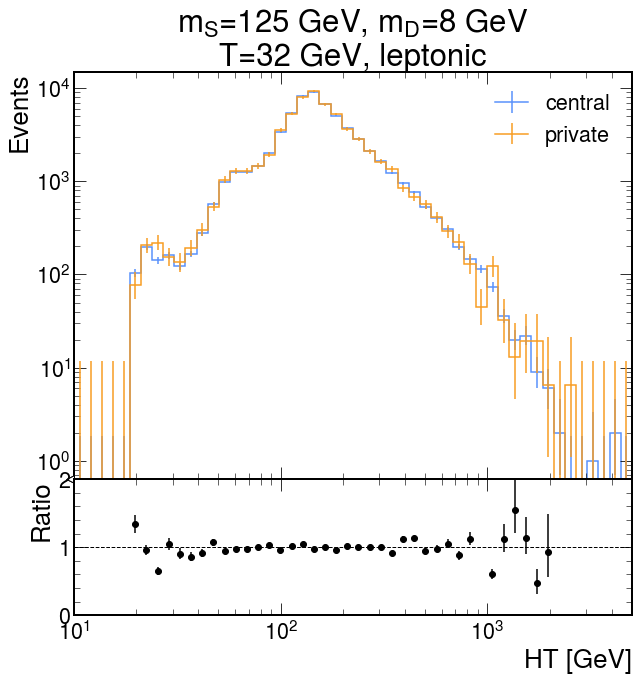

In [117]:
if os.path.isdir("validation_plots"):
    shutil.rmtree("validation_plots")

for model in track(models):
    events_c, events_p = load_events(*model)
    gen_muons_c, gen_muons_p = get_gen_muons(events_c, events_p)
    muons_c, muons_p = get_reco_muons(events_c, events_p)
    scalar_c, scalar_p = get_scalar_med(events_c, events_p)
    ht_c, ht_p = get_ht(events_c, events_p)

    plots = [
        {
            "quantity": "S_med_pt",
            "vals_c": scalar_c.pt,
            "vals_p": scalar_p.pt,
            "binning": (50, 0.1, 2000),
            "label": r"mediator S $p_T$ [GeV]",
            "log_x": True,
        },
        {
            "quantity": "S_med_eta",
            "vals_c": scalar_c.eta,
            "vals_p": scalar_p.eta,
            "binning": (50, -9, 9),
            "label": r"mediator S $\eta$",
        },
        {
            "quantity": "S_med_phi",
            "vals_c": scalar_c.phi,
            "vals_p": scalar_p.phi,
            "binning": (50, -4, 4),
            "label": r"mediator S $\phi$",
            "log_y": False,
        },
        {
            "quantity": "gen_muon_pt",
            "vals_c": ak.flatten(gen_muons_c.pt),
            "vals_p": ak.flatten(gen_muons_p.pt),
            "binning": (50, 3, 300),
            "label": r"GEN muon $p_T$ [GeV]",
            "log_x": True,
        },
        {
            "quantity": "gen_muon_eta",
            "vals_c": ak.flatten(gen_muons_c.eta),
            "vals_p": ak.flatten(gen_muons_p.eta),
            "binning": (50, -3, 3),
            "label": r"GEN muon $\eta$",
        },
        {
            "quantity": "gen_muon_phi",
            "vals_c": ak.flatten(gen_muons_c.phi),
            "vals_p": ak.flatten(gen_muons_p.phi),
            "binning": (50, -4, 4),
            "label": r"GEN muon $\phi$",
            "log_y": False,
        },
        {
            "quantity": "nGENMuon",
            "vals_c": ak.num(gen_muons_c),
            "vals_p": ak.num(gen_muons_p),
            "binning": (25, 0, 25),
        },
        {
            "quantity": "muon_pt",
            "vals_c": ak.flatten(muons_c.pt),
            "vals_p": ak.flatten(muons_p.pt),
            "binning": (50, 3, 300),
            "label": r"RECO muon $p_T$ [GeV]",
            "log_x": True,
        },
        {
            "quantity": "muon_eta",
            "vals_c": ak.flatten(muons_c.eta),
            "vals_p": ak.flatten(muons_p.eta),
            "binning": (50, -3, 3),
            "label": r"RECO muon $\eta$",
        },
        {
            "quantity": "muon_phi",
            "vals_c": ak.flatten(muons_c.phi),
            "vals_p": ak.flatten(muons_p.phi),
            "binning": (50, -4, 4),
            "label": r"RECO muon $\phi$",
            "log_y": False,
        },
        {
            "quantity": "nMuon",
            "vals_c": ak.num(muons_c),
            "vals_p": ak.num(muons_p),
            "binning": (25, 0, 25),
        },
        {
            "quantity": "HT",
            "vals_c": ht_c,
            "vals_p": ht_p,
            "binning": (50, 10, 5000),
            "label": "HT [GeV]",
            "log_x": True,
        },
    ]

    for plot in plots:
        plot_template(*model, **plot)

## Check statistics

In [6]:
paths = [
    "GluGluToSUEP_T0p25_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi1.000_T0.250_modeleptonic_1.root",
    "GluGluToSUEP_T0p25_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi1.000_T0.250_modeleptonic_1.root",
    "GluGluToSUEP_T0p25_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi1.000_T0.250_modeleptonic_1.root",
    "GluGluToSUEP_T0p25_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi1.000_T0.250_modeleptonic_1.root",
    "GluGluToSUEP_T0p25_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi1.000_T0.250_modeleptonic_1.root",
    "GluGluToSUEP_T0p25_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi1.000_T0.250_modeleptonic_1.root",
    "GluGluToSUEP_T0p25_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi1.000_T0.250_modeleptonic_1.root",
    "GluGluToSUEP_T0p25_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi1.000_T0.250_modeleptonic_1.root",
    "GluGluToSUEP_T0p35_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi1.400_T0.350_modehadronic_1.root",
    "GluGluToSUEP_T0p35_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi1.400_T0.350_modehadronic_1.root",
    "GluGluToSUEP_T0p35_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi1.400_T0.350_modehadronic_1.root",
    "GluGluToSUEP_T0p35_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi1.400_T0.350_modehadronic_1.root",
    "GluGluToSUEP_T0p35_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi1.400_T0.350_modehadronic_1.root",
    "GluGluToSUEP_T0p35_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi1.400_T0.350_modehadronic_1.root",
    "GluGluToSUEP_T0p35_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi1.400_T0.350_modehadronic_1.root",
    "GluGluToSUEP_T0p35_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi1.400_T0.350_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi6.000_T12.000_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi6.000_T12.000_modeleptonic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi6.000_T12.000_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi6.000_T12.000_modeleptonic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi6.000_T12.000_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi6.000_T12.000_modeleptonic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi6.000_T12.000_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi6.000_T12.000_modeleptonic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi6.000_T12.000_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi6.000_T12.000_modeleptonic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi6.000_T12.000_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi6.000_T12.000_modeleptonic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi6.000_T12.000_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi6.000_T12.000_modeleptonic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi6.000_T12.000_modehadronic_1.root",
    "GluGluToSUEP_T12p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi6.000_T12.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi4.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi4.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi4.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi4.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi4.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi4.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi4.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi4.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi4.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi4.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi4.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi4.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi4.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi4.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi4.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi4.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T16.000_modehadronic_1.root",
    "GluGluToSUEP_T16p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T16.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi4.000_T1.000_modehadronic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi4.000_T1.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi4.000_T1.000_modehadronic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi4.000_T1.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi4.000_T1.000_modehadronic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi4.000_T1.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi4.000_T1.000_modehadronic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi4.000_T1.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi4.000_T1.000_modehadronic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi4.000_T1.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi4.000_T1.000_modehadronic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi4.000_T1.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi4.000_T1.000_modehadronic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi4.000_T1.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi4.000_T1.000_modehadronic_1.root",
    "GluGluToSUEP_T1p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi4.000_T1.000_modeleptonic_1.root",
    "GluGluToSUEP_T1p40_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi1.400_T1.400_modehadronic_1.root",
    "GluGluToSUEP_T1p40_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi1.400_T1.400_modehadronic_1.root",
    "GluGluToSUEP_T1p40_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi1.400_T1.400_modehadronic_1.root",
    "GluGluToSUEP_T1p40_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi1.400_T1.400_modehadronic_1.root",
    "GluGluToSUEP_T1p40_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi1.400_T1.400_modehadronic_1.root",
    "GluGluToSUEP_T1p40_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi1.400_T1.400_modehadronic_1.root",
    "GluGluToSUEP_T1p40_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi1.400_T1.400_modehadronic_1.root",
    "GluGluToSUEP_T1p40_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi1.400_T1.400_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi6.000_T24.000_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi6.000_T24.000_modeleptonic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi6.000_T24.000_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi6.000_T24.000_modeleptonic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi6.000_T24.000_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi6.000_T24.000_modeleptonic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi6.000_T24.000_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi6.000_T24.000_modeleptonic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi6.000_T24.000_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi6.000_T24.000_modeleptonic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi6.000_T24.000_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi6.000_T24.000_modeleptonic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi6.000_T24.000_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi6.000_T24.000_modeleptonic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi6.000_T24.000_modehadronic_1.root",
    "GluGluToSUEP_T24p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi6.000_T24.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi2.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi2.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi2.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi2.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi2.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi2.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi2.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi2.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi2.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi2.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi2.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi2.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi2.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi2.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi2.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T2.000_modehadronic_1.root",
    "GluGluToSUEP_T2p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T2.000_modeleptonic_1.root",
    "GluGluToSUEP_T2p80_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi1.400_T2.800_modehadronic_1.root",
    "GluGluToSUEP_T2p80_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi1.400_T2.800_modehadronic_1.root",
    "GluGluToSUEP_T2p80_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi1.400_T2.800_modehadronic_1.root",
    "GluGluToSUEP_T2p80_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi1.400_T2.800_modehadronic_1.root",
    "GluGluToSUEP_T2p80_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi1.400_T2.800_modehadronic_1.root",
    "GluGluToSUEP_T2p80_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi1.400_T2.800_modehadronic_1.root",
    "GluGluToSUEP_T2p80_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi1.400_T2.800_modehadronic_1.root",
    "GluGluToSUEP_T2p80_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi1.400_T2.800_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T32.000_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T32.000_modeleptonic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modeleptonic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T32.000_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T32.000_modeleptonic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T32.000_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T32.000_modeleptonic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T32.000_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T32.000_modeleptonic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T32.000_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T32.000_modeleptonic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T32.000_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T32.000_modeleptonic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T32.000_modehadronic_1.root",
    "GluGluToSUEP_T32p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T32.000_modeleptonic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi6.000_T3.000_modehadronic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi6.000_T3.000_modeleptonic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi6.000_T3.000_modehadronic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi6.000_T3.000_modeleptonic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi6.000_T3.000_modehadronic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi6.000_T3.000_modeleptonic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi6.000_T3.000_modehadronic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi6.000_T3.000_modeleptonic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi6.000_T3.000_modehadronic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi6.000_T3.000_modeleptonic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi6.000_T3.000_modehadronic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi6.000_T3.000_modeleptonic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi6.000_T3.000_modehadronic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi6.000_T3.000_modeleptonic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi6.000_T3.000_modehadronic_1.root",
    "GluGluToSUEP_T3p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi6.000_T3.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi2.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi2.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi4.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi4.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi2.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi2.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi4.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi4.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi2.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi2.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi4.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi4.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi2.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi2.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi4.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi4.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi2.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi2.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi4.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi4.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi2.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi2.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi4.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi4.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi2.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi2.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi4.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi4.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi2.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi2.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi4.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi4.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T4.000_modehadronic_1.root",
    "GluGluToSUEP_T4p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T4.000_modeleptonic_1.root",
    "GluGluToSUEP_T5p60_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi1.400_T5.600_modehadronic_1.root",
    "GluGluToSUEP_T5p60_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi1.400_T5.600_modehadronic_1.root",
    "GluGluToSUEP_T5p60_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi1.400_T5.600_modehadronic_1.root",
    "GluGluToSUEP_T5p60_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi1.400_T5.600_modehadronic_1.root",
    "GluGluToSUEP_T5p60_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi1.400_T5.600_modehadronic_1.root",
    "GluGluToSUEP_T5p60_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi1.400_T5.600_modehadronic_1.root",
    "GluGluToSUEP_T5p60_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi1.400_T5.600_modehadronic_1.root",
    "GluGluToSUEP_T5p60_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi1.400_T5.600_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi6.000_T6.000_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi6.000_T6.000_modeleptonic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi6.000_T6.000_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi6.000_T6.000_modeleptonic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi6.000_T6.000_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi6.000_T6.000_modeleptonic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi6.000_T6.000_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi6.000_T6.000_modeleptonic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi6.000_T6.000_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi6.000_T6.000_modeleptonic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi6.000_T6.000_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi6.000_T6.000_modeleptonic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi6.000_T6.000_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi6.000_T6.000_modeleptonic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi6.000_T6.000_modehadronic_1.root",
    "GluGluToSUEP_T6p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi6.000_T6.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi2.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi2.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi4.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi4.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS1000.000_mPhi8.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi2.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi2.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi4.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi4.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS125.000_mPhi8.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi2.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi2.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi4.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi4.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS200.000_mPhi8.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi2.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi2.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi4.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi4.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS300.000_mPhi8.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi2.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi2.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi4.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi4.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS400.000_mPhi8.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi2.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi2.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi4.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi4.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS500.000_mPhi8.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi2.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi2.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi4.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi4.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS600.000_mPhi8.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi2.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi2.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi4.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi4.000_T8.000_modeleptonic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T8.000_modehadronic_1.root",
    "GluGluToSUEP_T8p00_TuneCP5_13TeV_pythia8+RunIISummer20UL18NanoAODv9-106X_upgrade2018_realistic_v16_L1v1-v2+NANOAODSIM/GluGluToSUEP_mS800.000_mPhi8.000_T8.000_modeleptonic_1.root",
]

In [7]:
def count_events(path):
    xrd_path = "root://cmseos.fnal.gov//store/user/chpapage"
    signal_central = f"{xrd_path}/Central_NANO_split_merged/" + path
    file_c = nanoevents.NanoEventsFactory.from_root(
        signal_central, schemaclass=nanoevents.NanoAODSchema
    )
    return len(file_c.events())

In [9]:
mS_masses = ["125", "200", "300", "400", "500", "600", "800", "1000"]
list_of_lists = []
for mS in track(mS_masses):
    list_of_nEvents = []
    for path in paths:
        if mS in path:
            nEvents = count_events(path)
            list_of_nEvents.append(nEvents)
    list_of_lists.append(np.array(list_of_nEvents))

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00

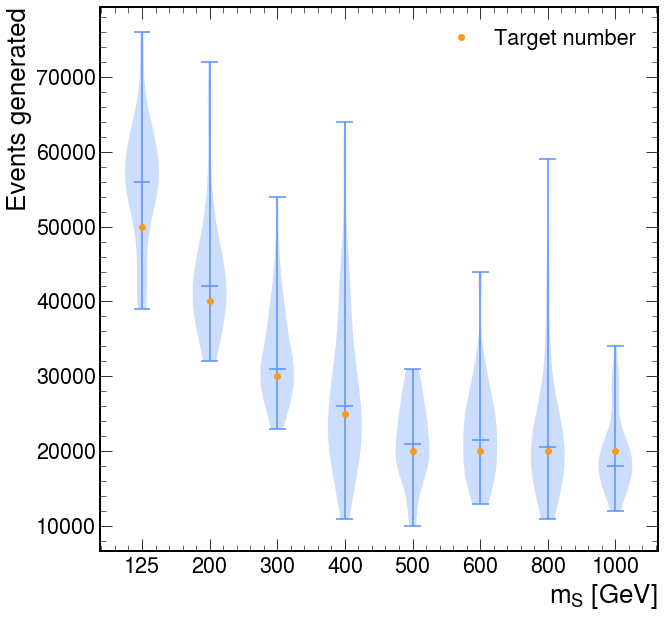

In [24]:
target_evts = [50000, 40000, 30000, 25000, 20000, 20000, 20000, 20000]
plt.violinplot(list_of_lists, showmeans=False, showmedians=True)
plt.plot(
    [y + 1 for y in range(len(list_of_lists))], target_evts, "o", label="Target number"
)
plt.xticks([y + 1 for y in range(len(list_of_lists))], labels=mS_masses)
plt.xlabel(r"$m_S$ [GeV]")
plt.ylabel("Events generated")
plt.legend()

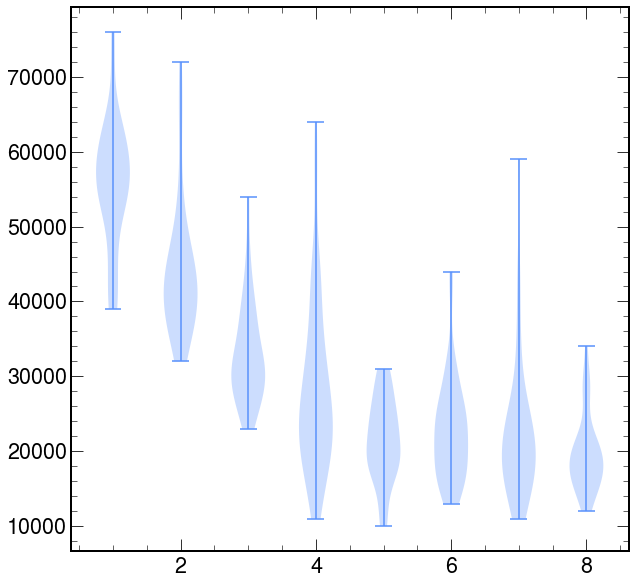

In [16]:
plt.violinplot(list_of_lists);

In [57]:
os.ctermid()

'/dev/tty'

In [13]:
def pileup_weight(nTrueInt):
    f_MC = uproot.open("../data/pileup/mcPileupUL2018.root")
    f_data = uproot.open("../data/pileup/PileupHistogram-UL2018-100bins_withVar.root")

    hist_MC = f_MC["pu_mc"].to_numpy()
    hist_data = f_data["pileup"].to_numpy()
    hist_data[0].sum()
    norm_data = hist_data[0] / hist_data[0].sum()
    weights = np.divide(
        norm_data, hist_MC[0], out=np.ones_like(norm_data), where=hist_MC[0] != 0
    )

    return weights[nTrueInt]

In [46]:
np.ones(len(events), dtype=bool)

array([ True,  True,  True, ...,  True,  True,  True])

In [47]:
trigger1 = np.ones(len(events), dtype=bool)
trigger2 = np.ones(len(events), dtype=bool)
trigger3 = np.ones(len(events), dtype=bool)
if "TripleMu_5_3_3_Mass3p8_DZ" in events.HLT.fields:
    trigger1 = events.HLT.TripleMu_5_3_3_Mass3p8_DZ == 1
if "TripleMu_10_5_5_DZ" in events.HLT.fields:
    trigger2 = events.HLT.TripleMu_10_5_5_DZ == 1

In [39]:
trigger3

<Array [{GenDressedLepton: [], ... ] type='2863 * struct[["GenDressedLepton", "e...'>

In [50]:
np.array([trigger1, trigger2, trigger3]).T

array([[ True,  True,  True],
       [ True,  True,  True],
       [ True, False,  True],
       ...,
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True]])

In [18]:
pu_weights = pileup_weight(ak.values_astype(events.Pileup.nTrueInt, np.int32))

In [19]:
events.genWeight * pu_weights

<Array [1.01, 1.17, 0.98, ... 0.98, 0.991] type='2863 * float32'>

In [20]:
events.Pileup.nTrueInt

<Array [36, 50, 22, 17, 21, ... 29, 38, 22, 23] type='2863 * float32[parameters=...'>

In [15]:
ak.flatten(events.Muon.jetIdx)

[0, 0, 0, 2, 0, 2, 1, 1, 0, 1, 1, 1, 0, ... 0, 1, -1, 1, 2, 5, 1, 5, 1, 1, 0, 3, 4]


In [86]:
def inter_isolation(leptons_1, leptons_2):
    """
    Compute the inter-isolation of each particle. It is supposed to work for one particle per event. The input is:
    - leptons_1: array of leptons for isolation calculation
    - leptons_2: array of all leptons in the events
    - dR: deltaR cut for isolation calculation
    """
    return (ak.sum(leptons_2.pt, axis=-1) - leptons_1.pt) / leptons_1.pt

In [163]:
gen_muons_mask = (
    (events.GenPart.pt > 3)
    & (abs(events.GenPart.eta) < 2.4)
    & (events.GenPart.status == 1)
    & (abs(events.GenPart.pdgId) == 13)
)
gen_muons = events.GenPart[gen_muons_mask]
clean_muons = (
    events.Muon.mediumId
    & (events.Muon.pt > 3)
    & (abs(events.Muon.eta) < 2.4)
    # & (abs(events.Muon.dz) <= 0.2)
)
muons = events.Muon[clean_muons]

# at_least_3_of_both = (ak.num(gen_muons) > 2) & (ak.num(muons) > 2)
# gen_muons = gen_muons[at_least_3_of_both]
# muons = muons[at_least_3_of_both]

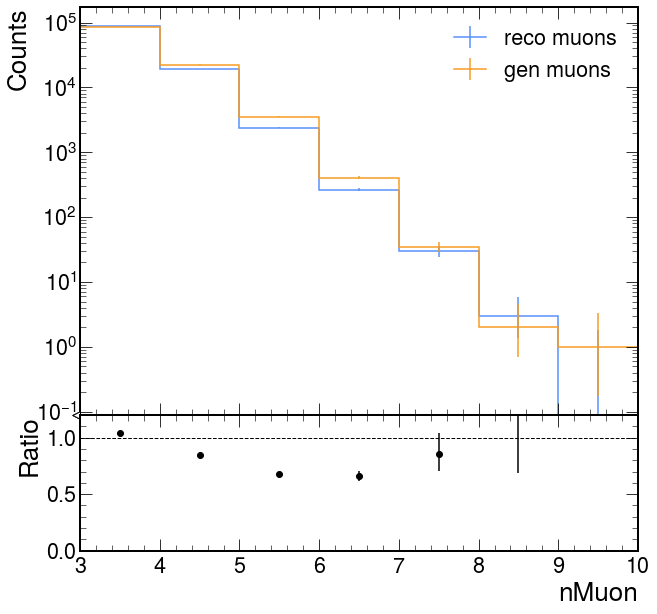

In [164]:
h_muon = (
    Hist.new.Reg(7, 3, 10, name="nMuon", label="nMuon").Double().fill(ak.num(muons))
)
h_gen_muon = (
    Hist.new.Reg(7, 3, 10, name="nMuon", label="nMuon").Double().fill(ak.num(gen_muons))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_muon.plot_ratio(
    h_gen_muon,
    rp_ylabel=r"Ratio",
    rp_num_label="reco muons",
    rp_denom_label="gen muons",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
subplot_ax.set_ylim(0, 1.2)
plt.show()

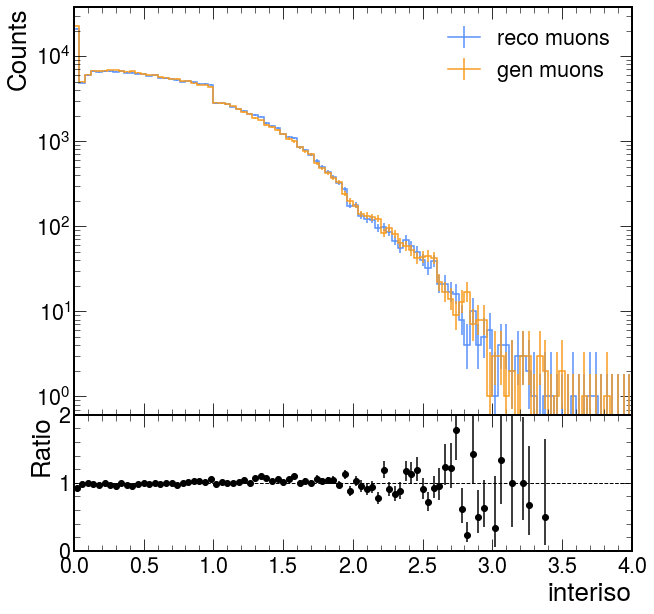

In [165]:
h_muon = (
    Hist.new.Reg(100, 0, 4, name="interiso", label="interiso")
    .Double()
    .fill(ak.flatten(inter_isolation(muons[:, :1], muons)))
)
h_gen_muon = (
    Hist.new.Reg(100, 0, 4, name="interiso", label="interiso")
    .Double()
    .fill(
        ak.flatten(
            inter_isolation(
                gen_muons[ak.argsort(gen_muons.pt, axis=1, ascending=False)][:, :1],
                gen_muons[ak.argsort(gen_muons.pt, axis=1, ascending=False)],
            )
        )
    )
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_muon.plot_ratio(
    h_gen_muon,
    rp_ylabel=r"Ratio",
    rp_num_label="reco muons",
    rp_denom_label="gen muons",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
subplot_ax.set_ylim(0, 2)
plt.show()

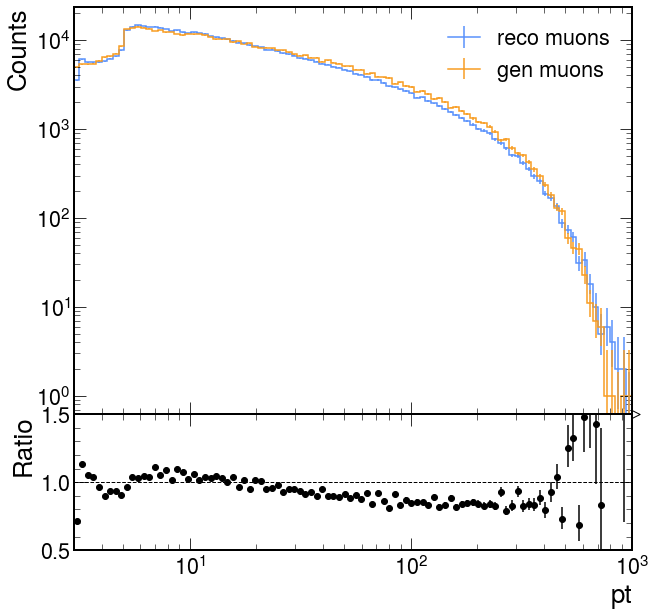

In [166]:
h_muon = (
    Hist.new.Reg(100, 3, 1000, name="pt", label="pt", transform=hist.axis.transform.log)
    .Double()
    .fill(ak.flatten(muons.pt))
)
h_gen_muon = (
    Hist.new.Reg(100, 3, 1000, name="pt", label="pt", transform=hist.axis.transform.log)
    .Double()
    .fill(ak.flatten(gen_muons.pt))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_muon.plot_ratio(
    h_gen_muon,
    rp_ylabel=r"Ratio",
    rp_num_label="reco muons",
    rp_denom_label="gen muons",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
subplot_ax.set_ylim(0.5, 1.5)
plt.xscale("log")
plt.show()

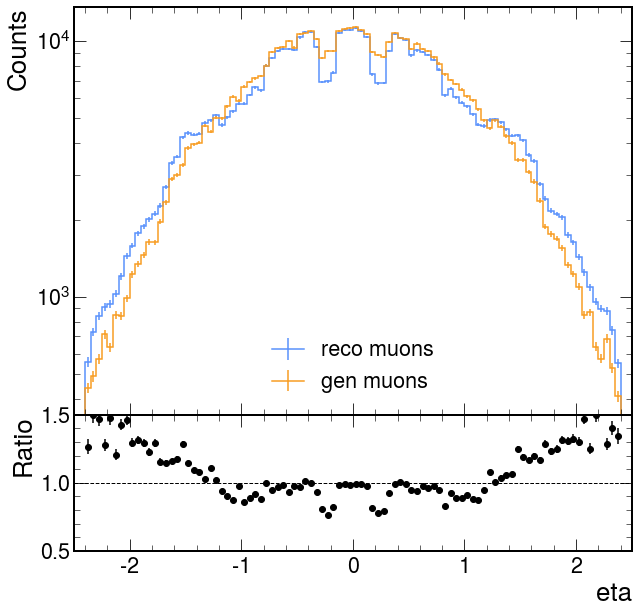

In [167]:
h_muon = (
    Hist.new.Reg(100, -2.5, 2.5, name="eta", label="eta")
    .Double()
    .fill(ak.flatten(muons.eta))
)
h_gen_muon = (
    Hist.new.Reg(100, -2.5, 2.5, name="eta", label="eta")
    .Double()
    .fill(ak.flatten(gen_muons.eta))
)

fig = plt.gcf()
grid = fig.add_gridspec(2, 1, hspace=0, height_ratios=[3, 1])

main_ax = fig.add_subplot(grid[0])
subplot_ax = fig.add_subplot(grid[1], sharex=main_ax)
plt.setp(main_ax.get_xticklabels(), visible=False)
ax_dict = {"main_ax": main_ax, "ratio_ax": subplot_ax}

main_ax_artists, sublot_ax_arists = h_muon.plot_ratio(
    h_gen_muon,
    rp_ylabel=r"Ratio",
    rp_num_label="reco muons",
    rp_denom_label="gen muons",
    ax_dict=ax_dict,
)
main_ax.set_yscale("log")
subplot_ax.set_ylim(0.5, 1.5)
plt.show()

[StairsArtists(stairs=<matplotlib.patches.StepPatch object at 0x7f57c43ab610>, errorbar=<ErrorbarContainer object of 3 artists>, legend_artist=<ErrorbarContainer object of 3 artists>)]

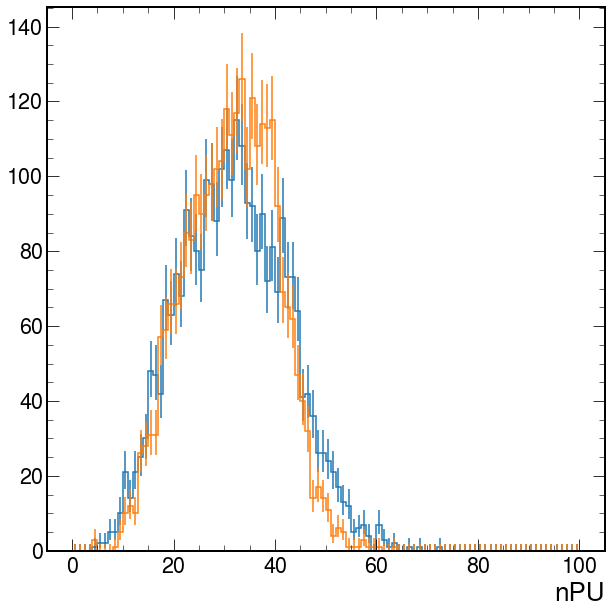

In [19]:
(
    Hist.new.Reg(100, 0, 100, name="nPU", label="nPU")
    .Double()
    .fill(events.Pileup.nPU + 0.1)
    .plot()
)
(
    Hist.new.Reg(100, 0, 100, name="nTrueInt", label="nTrueInt")
    .Double()
    .fill(events.Pileup.nTrueInt + 0.1)
    .plot()
)